# VisionTransformer finetuning gradcam / attention

In [ ]:
import torch

print("CUDA Available:", torch.cuda.is_available())
print("GPU Count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))

CUDA Available: True
GPU Count: 1
GPU Name: NVIDIA GeForce RTX 4070 Ti SUPER


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image

In [3]:
import random
# 再現性のためにランダムシードを設定
def set_seed(seed):
    random.seed(seed) # Python
    np.random.seed(seed) # NumPy
    torch.manual_seed(seed) # PyTorch
    
    # GPUを使う場合
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False # 再現性を重視

set_seed(42)  # 任意のシード値

- Pillow は RGB、OpenCV は BGRで読み込む

In [4]:
metadata = pd.read_csv("../data/HAM10000_metadata")
metadata

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern
...,...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen,vidir_modern
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen,vidir_modern
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen,vidir_modern
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face,vidir_modern


In [5]:
metadata_labels = metadata[['image_id', 'dx']]
metadata_labels

,image_id,dx
0,ISIC_0027419,bkl
1,ISIC_0025030,bkl
2,ISIC_0026769,bkl
3,ISIC_0025661,bkl
4,ISIC_0031633,bkl
...,...,...
10010,ISIC_0033084,akiec
10011,ISIC_0033550,akiec
10012,ISIC_0033536,akiec
10013,ISIC_0032854,akiec


In [6]:
labels = metadata_labels['dx'].map({"akiec":0, "bcc":1, "bkl":2, "df":3, "mel":4, "nv":5, "vasc":6})
labels

0        2
1        2
2        2
3        2
4        2
        ..
10010    0
10011    0
10012    0
10013    0
10014    4
Name: dx, Length: 10015, dtype: int64

In [7]:
# 画像ファイル名を取得
image_id = metadata_labels["image_id"].values
image_id

array(['ISIC_0027419', 'ISIC_0025030', 'ISIC_0026769', ...,
       'ISIC_0033536', 'ISIC_0032854', 'ISIC_0032258'], dtype=object)

In [8]:
# ラベルを取得
labels = labels.values
labels

array([2, 2, 2, ..., 0, 0, 4])

In [9]:
# インデックスを分割
from sklearn.model_selection import train_test_split

train_idx, val_idx = train_test_split(
    np.arange(len(image_id)),
    test_size = 0.3,
    stratify=labels, # クラスごとに均等に分割
    random_state = 42
)

- 検証に使用する画像のみのindex

In [10]:
val_idx

array([2301, 9459, 5232, ..., 2684, 8186, 5665])

### Vitの前処理

In [11]:
from timm.data import create_transform

train_transform = create_transform(
    input_size=224,  # ViTの入力サイズ
    is_training=True,  # 学習時のデータ拡張を有効化
    auto_augment="rand-m9-mstd0.5-inc1",  # RandAugment + 正規化の設定
    interpolation="bicubic"  # 画像の補間方法
)

val_transform = create_transform(
    input_size=224,
    is_training=False  # 検証時はデータ拡張なし
)

In [12]:
# ImageDataset クラスを定義し、データローダーで取得
from torch.utils.data import Dataset, DataLoader

image_path = "../data/images"

class ImageDataset(Dataset):
    def __init__(self, image_id, labels, transform=None):
        self.image_id = [f if f.endswith('.jpg') else f + ".jpg" for f in image_id] # 拡張子を追加
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_id)
    
    def __getitem__(self, idx):
        # 画像を指定するディレクトリを作成
        img_path = os.path.join(image_path, self.image_id[idx]) # self.image_id[idx]は画像ファイル名
        
        # ファイルが存在しない場合のエラー
        if not os.path.exists(img_path):
            raise FileNotFoundError(f"File not found: {img_path}")
        
        # ディレクトリで画像を指定しPIL形式で開き、#チャンネルに変換する
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)

        label  = torch.tensor(self.labels[idx], dtype=torch.long)
        return img, label

In [13]:
# CustomSubsetクラス
class CustomSubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]] # 元のデータセットから取得
        if self.transform:
            img = self.transform(img)
        
        return img, label

In [14]:
# 画像とラベルのデータセットを作成
dataset = ImageDataset(image_id, labels, transform=None)

# データセットの分割
train_dataset = CustomSubset(dataset, train_idx, transform=train_transform)
val_dataset = CustomSubset(dataset, val_idx, transform=val_transform)

# Dataloaderの作成
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

for imgs, labels in train_loader:
    print(f"Train Batch shape: {imgs.shape}, Labels: {labels}")
    break

for imgs, labels in val_loader:
    print(f"Val Batch shape: {imgs.shape}, Labels: {labels}")
    break

Train Batch shape: torch.Size([32, 3, 224, 224]), Labels: tensor([5, 5, 5, 2, 5, 2, 5, 5, 5, 5, 5, 5, 1, 5, 4, 4, 5, 2, 5, 2, 1, 5, 6, 1,
        5, 2, 5, 5, 0, 5, 5, 5])
Val Batch shape: torch.Size([32, 3, 224, 224]), Labels: tensor([4, 5, 5, 5, 5, 2, 5, 5, 5, 5, 5, 2, 5, 1, 0, 5, 5, 5, 2, 4, 2, 5, 5, 5,
        5, 5, 2, 5, 0, 5, 5, 4])


In [15]:
import psutil
print(f"使用中メモリ: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

使用中メモリ: 6.24 GB


In [16]:
# メモリの削減
# del image_tensors
# import gc
# gc.collect()

- 可視化する画像を選択

In [17]:
i = 0

val_index = val_idx[i] # val_datasetのi番目のインデックス
val_index

2301

In [18]:
# indexでアクセス
dataset.image_id[9459]

'ISIC_0034163.jpg'

ISIC_0034163.jpg


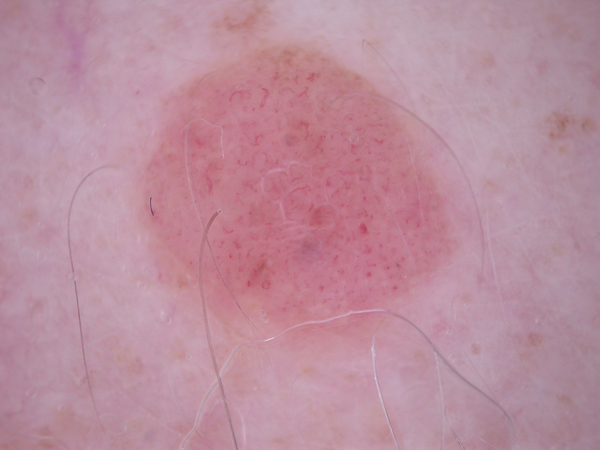

In [19]:
val_image_path = dataset.image_id[9459] # image_idはmetadataにある画像のid番号

val_image_path = os.path.join(image_path, val_image_path)
at_img = Image.open(val_image_path).convert("RGB")
print(dataset.image_id[9459])
at_img.show()

In [20]:
# モデルを定義
import timm

def build_model(model_name, pretrained, num_classes):
    model = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)
    return model

In [21]:
# 前処理
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_model(model_name="vit_base_patch16_224", pretrained=True, num_classes=7).to(device)

In [22]:
model_save_path = "/works/multirun/2025-07-05/06-39-41/1/best_model_model_vit_base_patch16_224_lr=0.0001_bs=32_id_cb477008d9dc4005ad13f451dd783acb.pth"
model.load_state_dict(torch.load(model_save_path))
model.to(device)

/tmp/ipykernel_48424/101296286.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path))


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

In [23]:
# valデータの中から、各クラス（0〜6）について、1枚ずつ「正解している画像」を見つけて保存
# クラスごとに1枚だけ保持する辞書
correct_samples = dict() # {class_id: (image_path, true_label, pred_label)}
model.eval()

for idx in val_idx:
    true_label = dataset.labels[idx]
    if true_label in correct_samples:
        continue # 正解画像をすでに記録していたらスキップ

    # 元画像取得
    image_id = [f if f.endswith('.jpg') else f + ".jpg" for f in image_id]
    image_full_path = os.path.join(image_path, image_id[idx])
    pil_image = Image.open(image_full_path).convert("RGB")

    # 前処理→テンソルにして推論
    image_tensor = val_transform(pil_image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_tensor)
        pred_label = torch.argmax(output, dim=1).item()

    # 正解していたら辞書に保存
    if pred_label == true_label:
        # デバッグ出力
        print(f"correct [idx {idx}] True: {true_label}, Pred: {pred_label}")
        # キーはクラスID（true_label）、値は (画像, 正解ラベル, 予測ラベル)
        correct_samples[true_label] = (pil_image, idx, true_label, pred_label)
    
    if len(correct_samples) == 7:
        break

wrong_samples = dict()
for idx in val_idx:
    true_label = dataset.labels[idx]
    if true_label in wrong_samples:
        continue # 不正解画像をすでに記録していたらスキップ

    # 元画像取得
    image_id = [f if f.endswith('.jpg') else f + ".jpg" for f in image_id]
    image_full_path = os.path.join(image_path, image_id[idx])
    pil_image = Image.open(image_full_path).convert("RGB")

    # 前処理→テンソルにして推論
    image_tensor = val_transform(pil_image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_tensor)
        pred_label = torch.argmax(output, dim=1).item()

    # 不正解の場合に辞書に保存
    if pred_label != true_label:
        # デバッグ出力
        print(f"wrong [idx {idx}] True: {true_label}, Pred: {pred_label}")
        # キーはクラスID（true_label）、値は (画像, 正解ラベル, 予測ラベル)
        wrong_samples[true_label] = (pil_image, idx, true_label, pred_label)
    
    if len(wrong_samples) == 7:
        break

correct [idx 9459] True: 5, Pred: 5
correct [idx 777] True: 2, Pred: 2
correct [idx 1521] True: 4, Pred: 4
correct [idx 9751] True: 0, Pred: 0
correct [idx 2927] True: 1, Pred: 1
correct [idx 2402] True: 6, Pred: 6
correct [idx 1188] True: 3, Pred: 3
wrong [idx 2301] True: 4, Pred: 5
wrong [idx 8447] True: 5, Pred: 4
wrong [idx 75] True: 2, Pred: 5
wrong [idx 2586] True: 1, Pred: 5
wrong [idx 9707] True: 0, Pred: 4
wrong [idx 1122] True: 3, Pred: 2
wrong [idx 2381] True: 6, Pred: 4


In [24]:
correct_samples

{5: (<PIL.Image.Image image mode=RGB size=600x450>, 9459, 5, 5),
 2: (<PIL.Image.Image image mode=RGB size=600x450>, 777, 2, 2),
 4: (<PIL.Image.Image image mode=RGB size=600x450>, 1521, 4, 4),
 0: (<PIL.Image.Image image mode=RGB size=600x450>, 9751, 0, 0),
 1: (<PIL.Image.Image image mode=RGB size=600x450>, 2927, 1, 1),
 6: (<PIL.Image.Image image mode=RGB size=600x450>, 2402, 6, 6),
 3: (<PIL.Image.Image image mode=RGB size=600x450>, 1188, 3, 3)}

In [25]:
from collections import Counter

val_labels = [dataset.labels[idx] for idx in val_idx]
val_class_counts = Counter(val_labels)
print("Validationセットのクラスごとの枚数:")
for cls in sorted(val_class_counts.keys()):
    print(f"Class {cls}: {val_class_counts[cls]} 枚")

Validationセットのクラスごとの枚数:
Class 0: 98 枚
Class 1: 154 枚
Class 2: 330 枚
Class 3: 34 枚
Class 4: 334 枚
Class 5: 2012 枚
Class 6: 43 枚


Correct | Class 5 Index: 9459 True: 5, Pred: 5


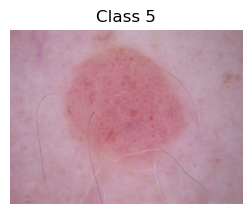

Correct | Class 2 Index: 777 True: 2, Pred: 2


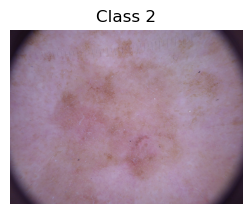

Correct | Class 4 Index: 1521 True: 4, Pred: 4


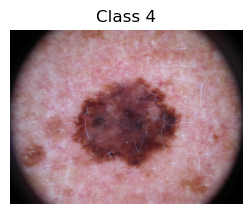

Correct | Class 0 Index: 9751 True: 0, Pred: 0


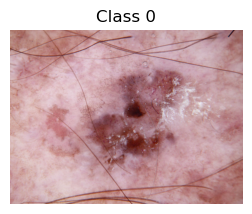

Correct | Class 1 Index: 2927 True: 1, Pred: 1


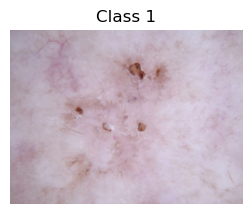

Correct | Class 6 Index: 2402 True: 6, Pred: 6


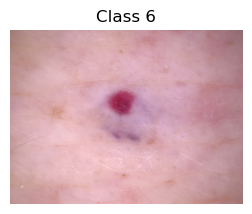

Correct | Class 3 Index: 1188 True: 3, Pred: 3


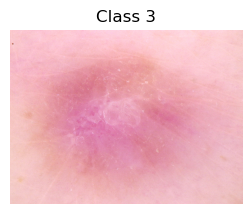

In [26]:
for class_id, (img, idx, true_label, pred_label) in correct_samples.items():
    print(f"Correct | Class {class_id} Index: {idx} True: {true_label}, Pred: {pred_label}")
    plt.subplots(figsize=(3, 3))
    plt.title(f"Class {class_id}")
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Wrong | Class 4 Index: 2301 True: 4, Pred: 5


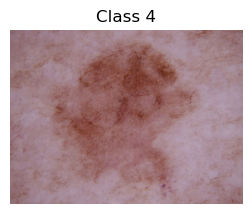

Wrong | Class 5 Index: 8447 True: 5, Pred: 4


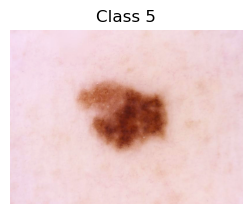

Wrong | Class 2 Index: 75 True: 2, Pred: 5


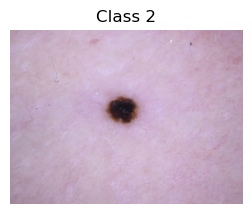

Wrong | Class 1 Index: 2586 True: 1, Pred: 5


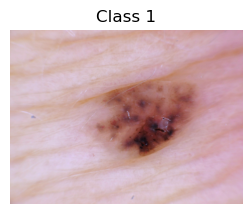

Wrong | Class 0 Index: 9707 True: 0, Pred: 4


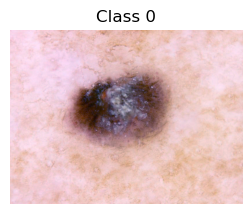

Wrong | Class 3 Index: 1122 True: 3, Pred: 2


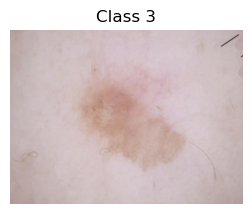

Wrong | Class 6 Index: 2381 True: 6, Pred: 4


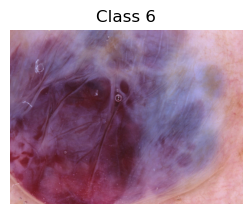

In [27]:
for class_id, (img, idx, true_label, pred_label) in wrong_samples.items():
    print(f"Wrong | Class {class_id} Index: {idx} True: {true_label}, Pred: {pred_label}")
    plt.subplots(figsize=(3, 3))
    plt.title(f"Class {class_id}")
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [28]:
# AttentionヘッドはAttentionを複数視点で見るという役割
print(model.blocks[0].attn.num_heads)

12


In [29]:
print(model.blocks[-1])

Block(
  (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (attn): Attention(
    (qkv): Linear(in_features=768, out_features=2304, bias=True)
    (q_norm): Identity()
    (k_norm): Identity()
    (attn_drop): Dropout(p=0.0, inplace=False)
    (proj): Linear(in_features=768, out_features=768, bias=True)
    (proj_drop): Dropout(p=0.0, inplace=False)
  )
  (ls1): Identity()
  (drop_path1): Identity()
  (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (mlp): Mlp(
    (fc1): Linear(in_features=768, out_features=3072, bias=True)
    (act): GELU(approximate='none')
    (drop1): Dropout(p=0.0, inplace=False)
    (norm): Identity()
    (fc2): Linear(in_features=3072, out_features=768, bias=True)
    (drop2): Dropout(p=0.0, inplace=False)
  )
  (ls2): Identity()
  (drop_path2): Identity()
)


In [30]:
print("attn_layer", model.blocks[-1].attn)

attn_layer Attention(
  (qkv): Linear(in_features=768, out_features=2304, bias=True)
  (q_norm): Identity()
  (k_norm): Identity()
  (attn_drop): Dropout(p=0.0, inplace=False)
  (proj): Linear(in_features=768, out_features=768, bias=True)
  (proj_drop): Dropout(p=0.0, inplace=False)
)


In [31]:
print("attn_layer.num_heads", model.blocks[-1].attn.num_heads)
print("attn_layer.head_dim", model.blocks[-1].attn.head_dim)
print("attn_layer.qkv.out_features", model.blocks[-1].attn.qkv.out_features)

attn_layer.num_heads 12
attn_layer.head_dim 64
attn_layer.qkv.out_features 2304


In [32]:
print("image_tensor.shape:", image_tensor.shape)

image_tensor.shape: torch.Size([1, 3, 224, 224])


## Attention map

In [33]:
def normalize(x: np.ndarray) -> np.ndarray:
    """
    最小値0、最大値1に正規化
    Attention値は0~1の確率（可視化時はピクセル（0-255）へ伸縮）
    """

    x = (x - x.min()) / (x.max() - x.min() + 1e-6)
    return x

In [34]:
import torch
from types import MethodType

def patch_attention(attn_module):
    """ Attentionモジュールのforwardメソッドを書き換え、Attention行列を保存する """
    def new_forward(self, x):
        B, N, C = x.shape
        # [B, N, 3, num_heads, C // num_heads] → [3, B, num_heads, N, C // num_heads]
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2,0,3,1,4)
        q, k, v = qkv[0], qkv[1], qkv[2] # すべて[B, H, N, D]

        # Attention計算
        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)
        self.last_attn = attn  # ← これを保存したい！

        # Attention出力
        x = (attn @ v).transpose(1, 2).reshape(B, N, C) # [B,H,N,D] -> [B,N,H,D] -> [B,N,C]
        x = self.proj(x)
        x = self.proj_drop(x)
        return x
    
    # new_forward はattn_moduleインスタンスにバインドされる→selfはAttentionモジュールのインスタンスになる
    attn_module.forward = MethodType(new_forward, attn_module)

In [35]:
def get_cls_attn_vector(model, x, block_idx, head_fuse):
    """指定したブロックのCLS行ベクトルを取得する"""
    model.eval()
    attn_layer = model.blocks[block_idx].attn
    patch_attention(attn_layer)

    with torch.no_grad():
        _ = model(x)                               # forward 1回

    A = attn_layer.last_attn                       # [B,H,L,L] = [1,]
    if head_fuse == "mean":
        A = A.mean(dim=1)                          # [B,L,L]
    elif head_fuse == "max":
        A = A.max(dim=1).values
    else:
        raise ValueError("head_fuse must be 'mean' or 'max'.")

    cls_row = A[0, 0, :]                           # [L]  ← CLS「行」
    return cls_row.detach()                       # [197]

In [36]:
import numpy as np, cv2, matplotlib.pyplot as plt

def show_map(img_pil, attn_vec, save_path=None):
    """Attentionマップを表示する"""
    W, H = img_pil.size
    num_patches = attn_vec.numel() - 1            # 197 → 196
    p = int(np.sqrt(num_patches))                 # 14

    cam = attn_vec[1:].reshape(p, p).cpu().numpy()
    cam = cv2.resize(cam, (W, H), interpolation=cv2.INTER_NEAREST)

    # min-max normalize
    mn, mx = cam.min(), cam.max()
    cam = (cam - mn) / (mx - mn + 1e-8)

    heatmap  = cv2.applyColorMap((cam * 255).astype(np.uint8), cv2.COLORMAP_JET)
    image_np = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
    overlay  = cv2.addWeighted(image_np, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(5,5))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    if save_path:
        save_path.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(str(save_path), bbox_inches="tight", pad_inches=0)
    plt.show()
    plt.close()

- numel()で要素数を取得

In [37]:
def visualize_samples(samples_dict, model, image_tensor):
    for class_id, (img, idx, true_label, pred_label) in samples_dict.items():
        attn_vec = get_cls_attn_vector(model, image_tensor, block_idx=-1, head_fuse="mean")  # ベクトル
        show_map(img, attn_vec, save_path=None)

In [38]:
image_tensor.shape

torch.Size([1, 3, 224, 224])

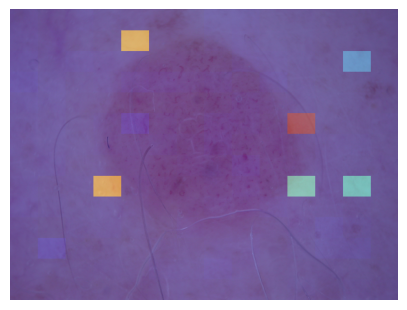

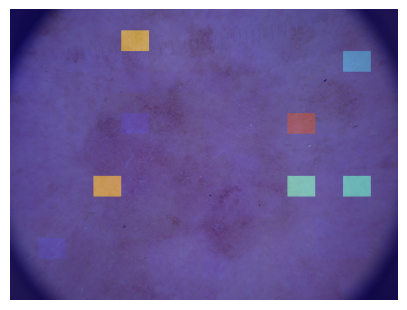

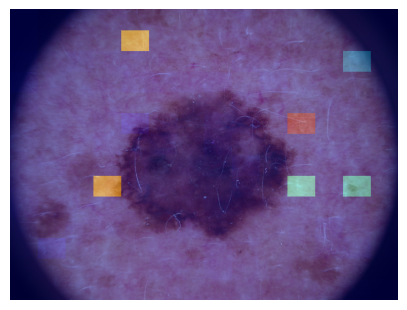

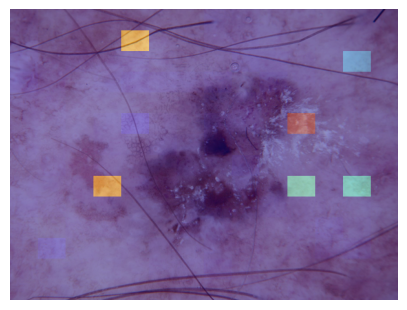

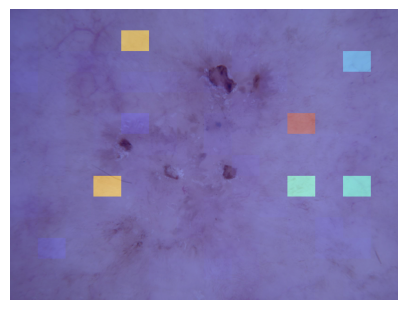

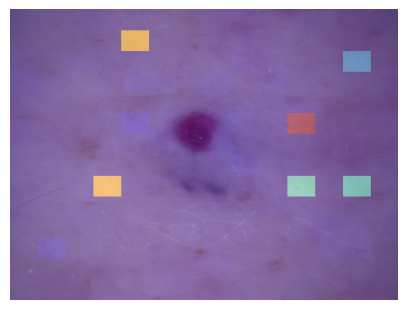

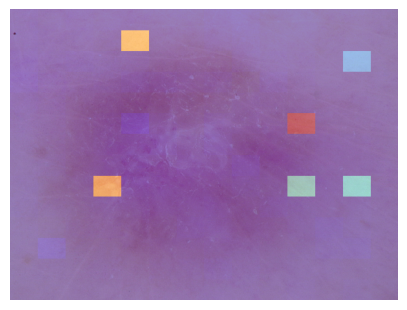

In [39]:
visualize_samples(correct_samples, model, image_tensor)

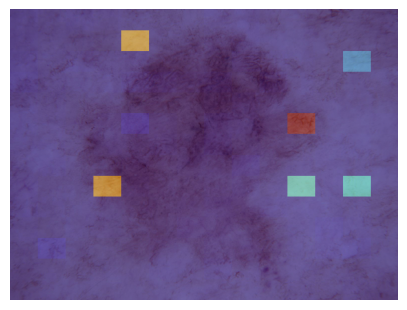

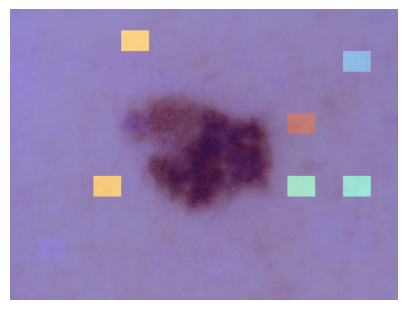

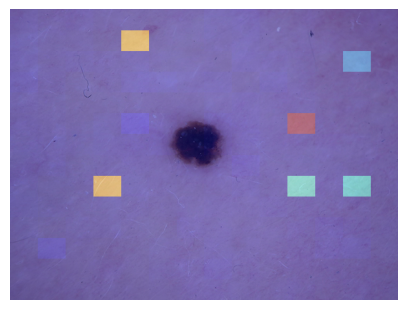

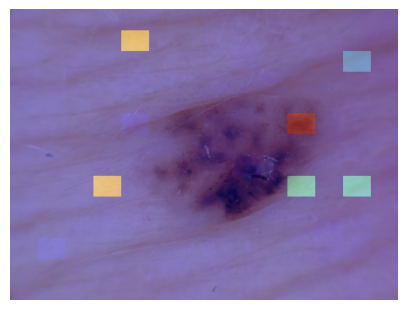

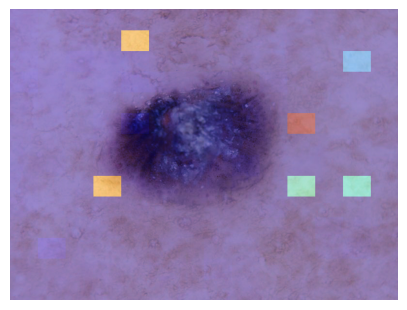

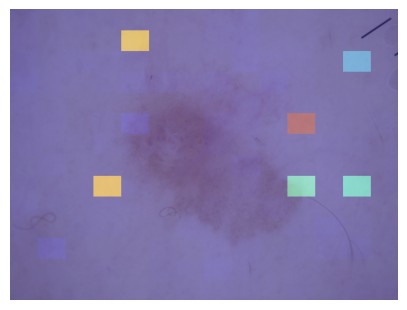

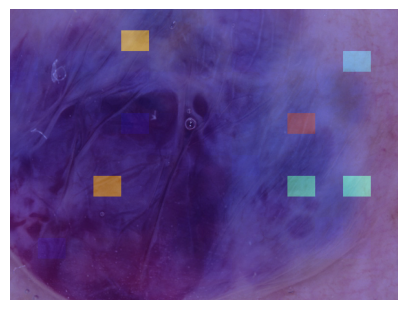

In [40]:
visualize_samples(wrong_samples, model, image_tensor)

In [41]:
first_key, (img_pil, idx, true_label, pred_label) = next(iter(correct_samples.items()))
true_label

5

In [42]:
items = list(correct_samples.items())
items

[(5, (<PIL.Image.Image image mode=RGB size=600x450>, 9459, 5, 5)),
 (2, (<PIL.Image.Image image mode=RGB size=600x450>, 777, 2, 2)),
 (4, (<PIL.Image.Image image mode=RGB size=600x450>, 1521, 4, 4)),
 (0, (<PIL.Image.Image image mode=RGB size=600x450>, 9751, 0, 0)),
 (1, (<PIL.Image.Image image mode=RGB size=600x450>, 2927, 1, 1)),
 (6, (<PIL.Image.Image image mode=RGB size=600x450>, 2402, 6, 6)),
 (3, (<PIL.Image.Image image mode=RGB size=600x450>, 1188, 3, 3))]

In [43]:
key, (img_pil, idx, true_label, pred_label) = items[2]
true_label

4

In [44]:
x_tensor = val_transform(img_pil).unsqueeze(0).to(device)

In [45]:
import numpy as np, cv2, torch, math, matplotlib.pyplot as plt

def minmax(x: np.ndarray, eps=1e-8):
    """Min-Max Normalization"""
    mn, mx = float(x.min()), float(x.max())
    return (x - mn) / (mx - mn + eps)

def cls_row_from_last_attn(attn_last: torch.Tensor) -> torch.Tensor:
    """
    - attn_last: [B,H,L,L] → ヘッド平均 → CLS行ベクトル[L]を返す
    """
    A = attn_last.mean(dim=1)        # [B,L,L]
    cls_row = A[0, 0, :]             # [L]
    return cls_row.detach()

def cls_row_to_cam(cls_row: torch.Tensor, model) -> np.ndarray:
    """
    - CLS行ベクトル[L=197] → パッチ部分を2D(gh,gw)に並べる
    """
    # grid_size
    gh, gw = model.patch_embed.grid_size
    n_patch = gh * gw
    L = cls_row.numel()
    assert L >= n_patch + 1, f"L={L}, gh*gw+1={n_patch+1}"
    
    patch_part = cls_row[-n_patch:]   # 末尾n_patchをパッチとみなす
    cam = patch_part.reshape(gh, gw).cpu().numpy()
    return minmax(cam)


In [46]:
def visualize_all_blocks(img_pil, model, x_tensor):
    """
    各ブロック（Encoder Block）のCLS→パッチ注意ヒートマップを 3x4 に並べて表示する
    """
    model.eval()

    # 1) 全ブロックのAttentionをパッチ（差し替え）する
    for blk in model.blocks:
        patch_attention(blk.attn)

    # 2) forward を1回だけ回して、全層の attn を確定させる
    with torch.no_grad():
        _ = model(x_tensor)

    # 3) 可視化の準備
    n_blocks = len(model.blocks)
    rows = math.ceil(n_blocks / 4)
    fig, axes = plt.subplots(rows, 4, figsize=(4*4, 3*rows))
    axes = np.array(axes).reshape(-1)  # flatten

    W, H = img_pil.size
    base_bgr = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)

    for b in range(n_blocks):
        attn_last = model.blocks[b].attn.last_attn   # [B,H,L,L]
        assert attn_last.ndim == 4, f"unexpected shape at block {b}: {attn_last.shape}"

        cls_row  = cls_row_from_last_attn(attn_last)         # [L]
        cam2d    = cls_row_to_cam(cls_row, model)            # [gh,gw] (min-max済)
        cam_resz = cv2.resize(cam2d, (W, H), interpolation=cv2.INTER_NEAREST)

        heat  = cv2.applyColorMap((cam_resz * 255).astype(np.uint8), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(base_bgr, 0.6, heat, 0.4, 0)

        axes[b].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        axes[b].set_title(f"Block {b}", fontsize=10)
        axes[b].axis("off")

    # 余白の空き軸を消す
    for k in range(n_blocks, len(axes)):
        axes[k].axis("off")

    plt.tight_layout()
    plt.show()

    # save_file = Path("../outputs/attention_map/vit") / \
    # f"cls{class_id}_idx{idx}_true{true_label}_pred{pred_label}_allblock.png"

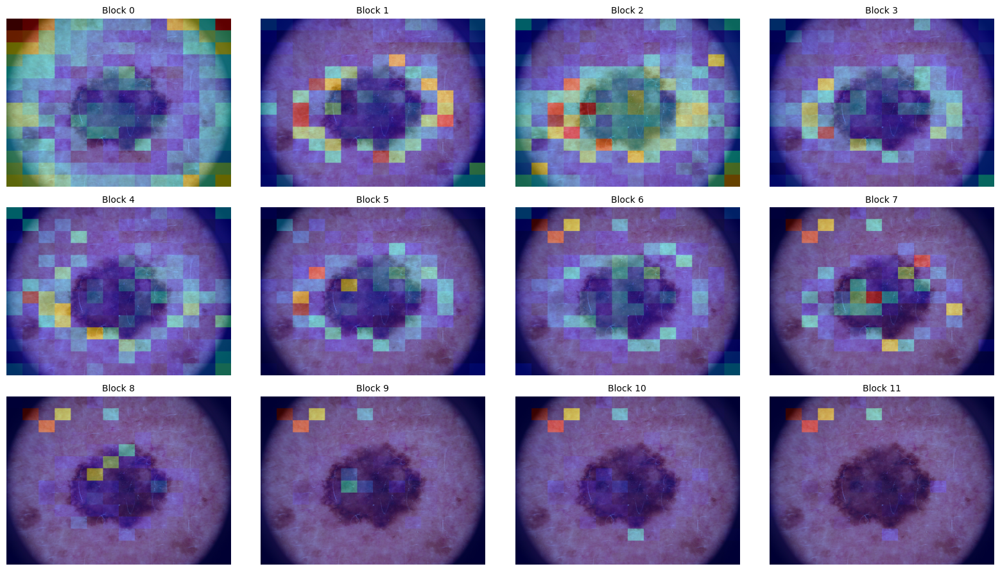

In [47]:
visualize_all_blocks(img_pil, model, x_tensor)

## Attention Rollout

In [48]:
import torch

@torch.no_grad()
def collect_attn_per_layer(model, x_tensor, fuse="mean"):
    """
    各ブロックの attn（[B,H,L,L]）を forward 1回で集め、ヘッド融合して [B,L,L] のリストで返す。
    - fuse: "mean" or "max"
    """
    model.eval()

    # すべてのブロックをパッチ（差し替え）
    for blk in model.blocks:
        patch_attention(blk.attn)

    _ = model(x_tensor)  # 1回だけ forward

    A_list = []
    for blk in model.blocks:
        A = blk.attn.last_attn            # [B,H,L,L]
        if fuse == "max":
            A = A.max(dim=1).values       # [B,L,L]
        else:
            A = A.mean(dim=1)             # [B,L,L]
        A_list.append(A.detach())
    return A_list  # list[[B,L,L]]は各ブロックから得られた多ヘッド平均済みのattention行列のリスト


In [49]:
def add_residual_and_row_norm(A, alpha=0.5, eps=1e-6):
    """
    attentionに残差を混ぜて行正規化する
    - A: [B,L,L]（ヘッド融合済み）
    - 返り値: [B,L,L]
    """
    B, L, _ = A.shape
    I = torch.eye(L, device=A.device).expand(B, L, L)
    A = alpha * I + (1.0 - alpha) * A
    A = A / (A.sum(dim=-1, keepdim=True) + eps)  # 行ごとに確率化
    return A

@torch.no_grad()
def attention_rollout(A_list, alpha=0.5):
    """
    A_list: list of [B,L,L]（層順）
    返り値: R [B,L,L]
    """
    assert len(A_list) > 0
    B, L, _ = A_list[0].shape
    R = torch.eye(L, device=A_list[0].device).expand(B, L, L).clone()
    
    # CLSから各パッチに最終的にどれだけ情報が届くかを累積していく
    for A in A_list:
        A_tilde = add_residual_and_row_norm(A, alpha=alpha)
        # これまでの到達確率を次の層のAttentionと掛け合わせて更新
        R = torch.bmm(R, A_tilde)
    return R  # [B,L,L]の行列で、行iがCLS、列jがパッチjへの最終的な到達確率を表す

In [50]:
import numpy as np, cv2, matplotlib.pyplot as plt

def visualize_rollout(img_pil, model, x_tensor, fuse="mean", alpha=0.5,
                    use_pct=True, gamma=0.9):
    """
    Rolloutのヒートマップを1枚表示する
    - fuse: ヘッド融合（"mean" or "max"）
    - alpha: 残差の混合率（0.5）
    - use_pct: 5-95パーセンタイルでクリップするか（外れ値を無視）
    - gamma: ガンマ補正（1.0で補正なし、<1で強調、>1で弱調整）
    """
    # 1) 各層の [B,L,L] を収集
    A_list = collect_attn_per_layer(model, x_tensor, fuse=fuse)  # 層順

    # 2) ロールアウト
    R = attention_rollout(A_list, alpha=alpha)   # [B,L,L]
    cls_row = R[0, 0, :]                         # [L]

    # 3) 2D化
    cam2d = cls_row_to_cam(cls_row, model)       # [gh,gw]
    if use_pct:
        a, b = np.percentile(cam2d, [5, 95])
        cam2d = np.clip((cam2d - a) / (b - a + 1e-8), 0, 1)
    if gamma != 1.0:
        cam2d = cam2d ** gamma

    # 4) オーバレイ
    W, H = img_pil.size
    cam_resz = cv2.resize(cam2d, (W, H), interpolation=cv2.INTER_NEAREST)
    heat = cv2.applyColorMap((cam_resz * 255).astype(np.uint8), cv2.COLORMAP_JET)
    base = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
    overlay = cv2.addWeighted(base, 0.55, heat, 0.45, 0)

    plt.figure(figsize=(5,5))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(f"Attention Rollout (fuse={fuse}, α={alpha})")
    plt.axis("off")
    plt.show()


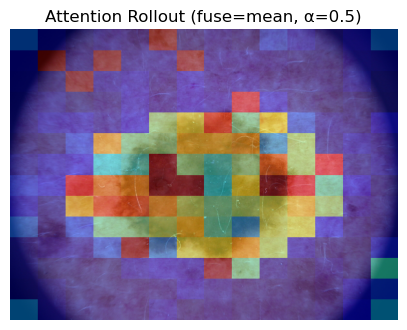

In [51]:
visualize_rollout(img_pil, model, x_tensor, fuse="mean", alpha=0.5)

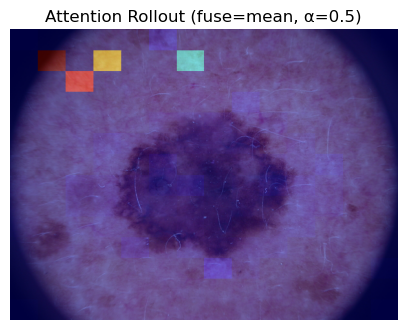

In [52]:
visualize_rollout(img_pil, model, x_tensor, fuse="mean", alpha=0.5, use_pct=False, gamma=1.0)

## Transformer_Explainer

In [ ]:
import sys
from pathlib import Path
# project_rootを設定
# notebooks/ から見て、上位にある Transformer_Explainability をパスへ追加
# project_root/notebooks/ このノート → project_root/Transformer_Explainability/ を追加
root = Path.cwd().parent       # <- notebooks/ の1つ上位
sys.path.append(str((root / "Transformer_Explainability").resolve()))

In [54]:
from baselines.ViT.ViT_LRP import VisionTransformer
from baselines.ViT.ViT_explanation_generator import LRP as LRP_CLASS

In [55]:
# LRP対応のVitを構築
model_lrp = VisionTransformer(img_size=224, patch_size=16, num_classes=7)
# 重みは今までのモデルと共有
model_lrp.load_state_dict(model.state_dict(), strict=False)
model_lrp.eval().to(device)

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  )
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (matmul1): einsum()
        (matmul2): einsum()
        (qkv): Linear(in_features=768, out_features=2304, bias=False)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
        (softmax): Softmax(dim=-1)
      )
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (add1): Add()
      (add2): Add()
      (clone1): Clone()
      (clone2): C

In [56]:
class CheferTransformerExplainer:
    """
    timm の VisionTransformer に、Chefer 公式の LRP を適用する薄いラッパ。
    - no_grad は使わない（LRPが勾配/フックを使うため）。
    """

    def __init__(self, model):
        """
        - model: LRP対応の VisionTransformer
        - model.eval() にして渡す（Dropout/BNを固定）
        - ただし forward 時に no_grad は使わない
        """
        self.model = model
        # 公式の LRP クラスを初期化。内部で必要なフックを登録する。
        self.core = LRP_CLASS(self.model)
        self._call_kind = "generate_LRP"

    @torch.inference_mode(False)  # 勾配を有効にする（evalだがno_gradにしない）
    def explain(self, x: torch.Tensor, target_class: int,
                start_layer: int = 1):
        """
        クラス依存の説明マップ
        - x: [B,3,H,W] テンソル（device は model と同じ）
        - target_class: 可視化したいクラスID（logitのインデックス）
        - start_layer: どの層から寄与伝播を開始するか（通常 1=パッチ埋め込み直後から）
        - return: List[np.ndarray]（各画像の 2D マップ）
        """
        assert x.ndim == 4, f"x shape must be [B,3,H,W], got {tuple(x.shape)}"
        B = x.size(0)

        cams = []
        for b in range(B):
            xb = x[b:b+1]  # [1,3,H,W]
            cam = self.core.generate_LRP(
                xb,
                index=int(target_class),
                method="transformer_attribution",  # 公式の手法名
                start_layer=start_layer,
            )
            
            if isinstance(cam, torch.Tensor):
                cam = cam.detach().cpu().numpy()
            cam = np.asarray(cam, dtype=np.float32)
            
            cams.append(cam)
        return cams

In [57]:
def visualize_transformer_explainer(img_pil, model, x_tensor, target_class, use_pct=True, gamma=0.9):
    """
    Transformer_explainerのヒートマップを1枚表示する
    - alpha: 残差の混合率（0.5）
    - use_pct: 5-95パーセンタイルでクリップするか（外れ値を無視）
    - gamma: ガンマ補正（1.0で補正なし、<1で強調、>1で弱調整）
    """
    
    assert x_tensor.ndim == 4 and x_tensor.size(0) == 1, f"x_tensor shape must be [1,3,H,W], got {tuple(x_tensor.shape)}"
    model.eval()  # no_grad は付けない
    explainer = CheferTransformerExplainer(model)
    cams = explainer.explain(x_tensor, target_class=target_class, start_layer=1)
    cam = cams[0] # 1枚目を取り出す（1, 196）
    
    if cam.ndim == 2 and cam.shape[0] == 1:
        cam = cam.squeeze(0)  # -> (196,)
    
    gh = gw = int(np.sqrt(cam.shape[0]))  # 14
    cam = cam.reshape(gh, gw)  # (14,14)
    
    cam = minmax(cam)
    
    # 表示用の強調（外れ値クリップとガンマ補正）
    if use_pct:
        a, b = np.percentile(cam, [5, 95])
        cam = np.clip((cam - a) / (b - a + 1e-8), 0, 1)
    if gamma != 1.0:
        cam = cam ** gamma

    # オーバレイ
    W, H = img_pil.size
    cam_resz = cv2.resize(cam, (W, H), interpolation=cv2.INTER_NEAREST)
    heat = cv2.applyColorMap((cam_resz * 255).astype(np.uint8), cv2.COLORMAP_JET)
    base = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
    overlay = cv2.addWeighted(base, 0.55, heat, 0.45, 0)

    plt.figure(figsize=(5, 5))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(f"Transformer-Explainer (class={target_class})")
    plt.axis("off")
    plt.show()

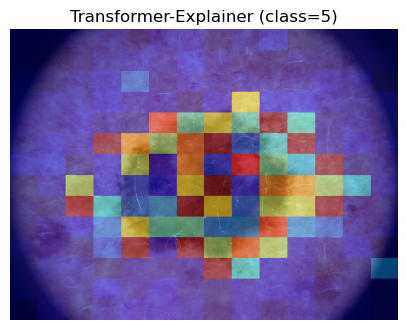

In [58]:
visualize_transformer_explainer(img_pil, model_lrp, x_tensor, target_class=5, use_pct=True, gamma=0.9)

## Grad-CAM

- timmモデルを再定義する（Attention可視化時のモンキーパッチが恒久的）

In [59]:
# 前処理
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_model(model_name="vit_base_patch16_224", pretrained=True, num_classes=7).to(device)

In [60]:
model_save_path = "/works/multirun/2025-07-05/06-39-41/1/best_model_model_vit_base_patch16_224_lr=0.0001_bs=32_id_cb477008d9dc4005ad13f451dd783acb.pth"
model.load_state_dict(torch.load(model_save_path))
model.to(device)

/tmp/ipykernel_48424/101296286.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path))


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

In [61]:
model.patch_embed.grid_size

(14, 14)

In [62]:
import torch, numpy as np, cv2

class GradCam:
    """
    ViT 用Grad-CAM
    - target_layer は [B, N, C] 形のトークン表現を出す層
    - CAM は CLS を除いたパッチトークンを (gh, gw) に並べ直して返す
    """
    def __init__(self, model: torch.nn.Module, target_layer: torch.nn.Module):
        self.model = model.eval() # eval だが no_grad は使わない
        self.target = target_layer
        self._feat = None   # forward 出力（[B,N,C]）
        self._grad = None   # その出力に対する勾配（[B,N,C]）
        self.h_fwd = None

    # ---- hooks ----
    def _register_hooks(self):
        def fwd_hook(module, inp, out):
            self._feat = out # forwardの出力out: [B, N, C]を保存
            def save_grad(grad):
                self._grad = grad # その出力に対する勾配を保存
            out.register_hook(save_grad) # 出力テンソルにbackward hookを登録
        # forwardする直前にフックを登録し、fwd_hookが呼ばれたときに特徴マップを保存
        self.h_fwd = self.target.register_forward_hook(fwd_hook)

    def _remove_hooks(self):
        if self.h_fwd is not None:
            self.h_fwd.remove()
            self.h_fwd = None

    # ---- 形状変換: [B,N,C] -> [B,C,gh,gw] ----
    @staticmethod # <-インスタンス（self）に依存しない
    def _tokens_to_map(toks: torch.Tensor, gh: int, gw: int) -> torch.Tensor:
        # toks: [B, N, C]（N=1+gh*gw or gh*gw）
        if toks.dim() != 3:
            raise ValueError(f"expected [B,N,C], got {toks.shape}")
        B, N, C = toks.shape
        
        # CLS を含むなら除去
        if N == gh*gw + 1:
            toks = toks[:, 1:, :] # 先頭を除く
            N -= 1
            
        if N != gh*gw:
            raise ValueError(f"N={N} but gh*gw={gh*gw}")
        # [B, gh*gw, C] -> [B, gh, gw, C] -> [B, C, gh, gw]
        return toks.reshape(B, gh, gw, C).permute(0, 3, 1, 2).contiguous()

    @torch.inference_mode(False)  # 勾配を有効
    def __call__(self, inputs: torch.Tensor, target_class: int | None = None,
                 img_size: tuple[int,int] = (224,224)) -> np.ndarray:
        """
        return: CAM の 2D 配列（img_size にリサイズ済み, np.float32 [0..1]）
        """
        self._feat = self._grad = None
        self._register_hooks()
        
        x = inputs.to(device)
        ph, pw = self.model.patch_embed.proj.kernel_size
        sh, sw = self.model.patch_embed.proj.stride
        H, W = x.shape[-2:]
        gh = (H - ph) // sh + 1
        gw = (W - pw) // sw + 1

        # forward実行
        self.model.zero_grad(set_to_none=True) # 勾配をゼロに初期化
        out = self.model(x)                    # [B,C]
        index = int(out[0].argmax(-1) if target_class is None else target_class)
        # backward実行
        out[0, index].backward(retain_graph=False) # autogradグラフを破棄

        # 取得
        feat = self._feat           # [B,N,C]
        grad = self._grad           # [B,N,C]
        if feat is None or grad is None:
            self._remove_hooks()
            raise RuntimeError("hooks did not capture features/gradients; check target_layer")

        # トークン → マップ [B,C,gh,gw]
        feat_map = self._tokens_to_map(feat, gh, gw)[0].detach().cpu().numpy()
        grad_map = self._tokens_to_map(grad, gh, gw)[0].detach().cpu().numpy()

        # 重要度（チャネル平均の勾配）
        weight = grad_map.mean(axis=(1, 2))             # [C]
        cam = np.sum(feat_map * weight[:, None, None], axis=0)  # [gh,gw]
        cam = np.maximum(cam, 0)                        # ReLU

        # 正規化
        cam_min, cam_max = float(cam.min()), float(cam.max())
        if cam_max > cam_min:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = np.zeros_like(cam, dtype=np.float32)

        # リサイズ
        cam = cv2.resize(cam.astype(np.float32), img_size, interpolation=cv2.INTER_CUBIC)
        self._remove_hooks()
        return cam

In [63]:
target_layer = model.blocks[-1].norm1
target_layer

LayerNorm((768,), eps=1e-06, elementwise_affine=True)

In [64]:
def show_gradcam(sample_dict, result, target_layer):
    grad_cam = GradCam(model, target_layer)
    for class_id, (pil_img, idx, true_label, pred_label) in sample_dict.items():
        image_tensor = val_transform(pil_img).unsqueeze(0)
        cam_mask = grad_cam(image_tensor, target_class=true_label, img_size=(224,224))

        # ヒートマップ化
        cam_min, cam_max = cam_mask.min(), cam_mask.max()
        denom = cam_max - cam_min
        if denom == 0:
            heatmap = np.zeros_like(cam_mask)
        else:
            heatmap = (cam_mask - cam_min) / (denom + 1e-8)
        heatmap = np.nan_to_num(heatmap)

        # オーバレイ
        W, H = pil_img.size
        cam_resz = cv2.resize(heatmap, (W, H), interpolation=cv2.INTER_NEAREST)
        heat = cv2.applyColorMap((cam_resz * 255).astype(np.uint8), cv2.COLORMAP_JET)
        base = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)
        overlay = cv2.addWeighted(base, 0.55, heat, 0.45, 0)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        print(f"{result} Grad-CAM  Class {class_id}  idx:{idx}  true:{true_label} pred:{pred_label}")
        plt.axis("off")
        plt.show()

Correct Grad-CAM  Class 5  idx:9459  true:5 pred:5


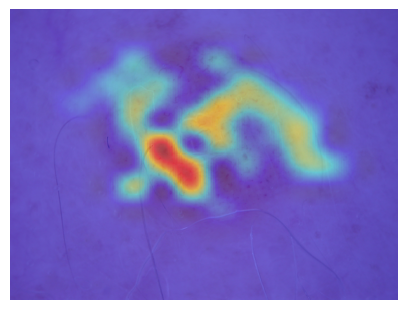

Correct Grad-CAM  Class 2  idx:777  true:2 pred:2


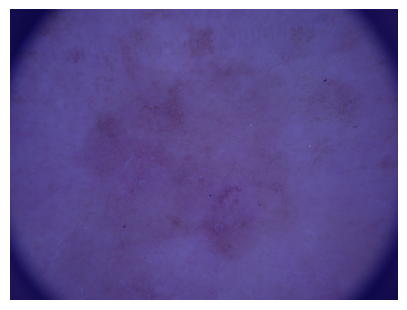

Correct Grad-CAM  Class 4  idx:1521  true:4 pred:4


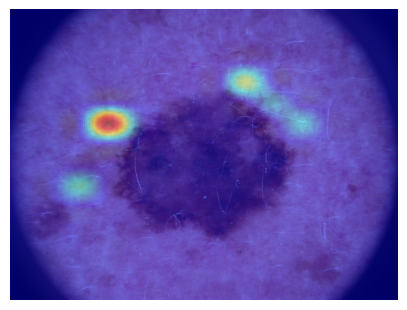

Correct Grad-CAM  Class 0  idx:9751  true:0 pred:0


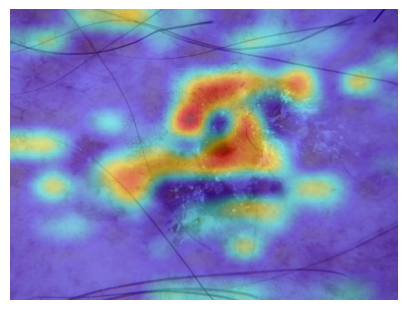

Correct Grad-CAM  Class 1  idx:2927  true:1 pred:1


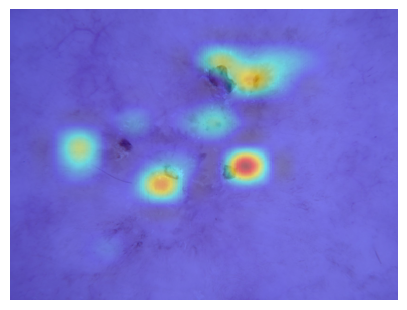

Correct Grad-CAM  Class 6  idx:2402  true:6 pred:6


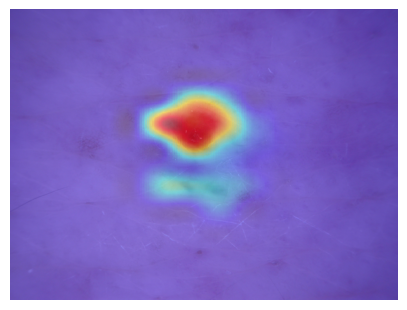

Correct Grad-CAM  Class 3  idx:1188  true:3 pred:3


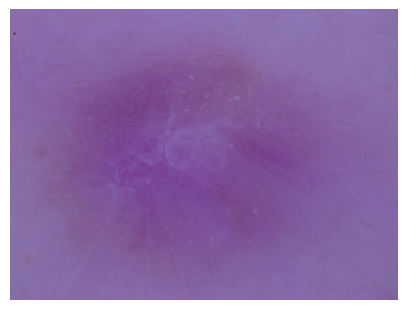

In [65]:
show_gradcam(correct_samples, "Correct", model.blocks[-1].norm1)

In [66]:
def show_all_gradcam(sample_dict):

    num_blocks = len(model.blocks)
    num_classes = len(sample_dict)

    fig, axes = plt.subplots(nrows=num_classes, ncols=num_blocks, figsize=(num_blocks * 2, num_classes * 2))

    for row, (class_id, (pil_img, _, true_label, _)) in enumerate(sample_dict.items()):
        image_tensor = val_transform(pil_img).unsqueeze(0)  # 各画像に対して再生成

        for col, block in enumerate(model.blocks):
            target_layer = block.norm1 
            grad_cam = GradCam(model, target_layer)
            cam_mask = grad_cam(image_tensor, target_class=true_label, img_size=(224,224))

            # スケーリング（ゼロ除算を避ける）
            cam_min = cam_mask.min()
            cam_max = cam_mask.max()
            denom = cam_max - cam_min
            heatmap = np.zeros_like(cam_mask) if denom == 0 else (cam_mask - cam_min) / denom
            heatmap = np.nan_to_num(heatmap)

            # ヒートマップ → カラー変換
            W, H = pil_img.size
            cam_resz = cv2.resize(heatmap, (W, H), interpolation=cv2.INTER_NEAREST)
            heat = cv2.applyColorMap((cam_resz * 255).astype(np.uint8), cv2.COLORMAP_JET)
            base = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)
            overlay = cv2.addWeighted(base, 0.55, heat, 0.45, 0)

            ax = axes[row, col]
            ax.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
            ax.axis("off")
            if row == 0:
                ax.set_title(f"Block {col}", fontsize=10)
            if col == 0:
                ax.set_ylabel(f"Class {class_id}", fontsize=10)

    plt.tight_layout()
    plt.show()

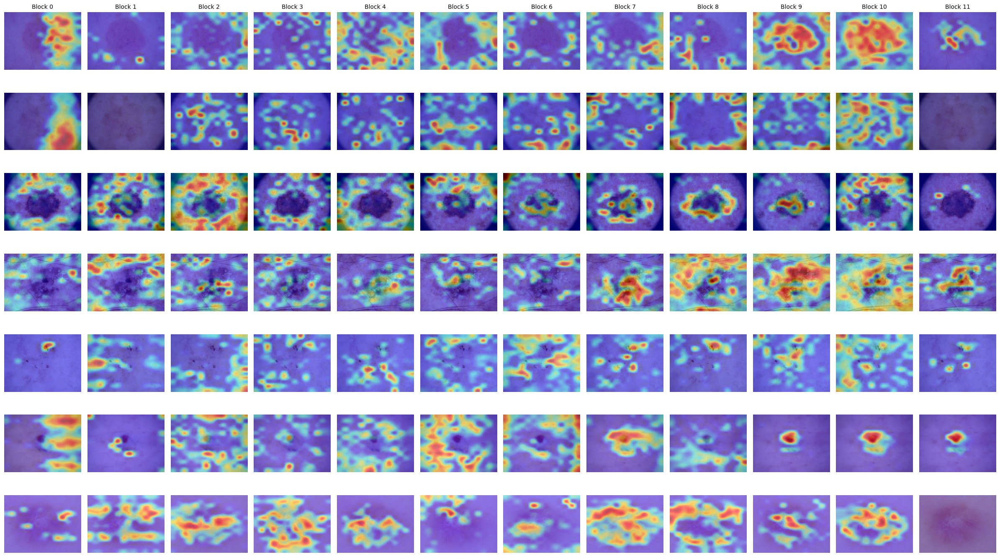

In [67]:
show_all_gradcam(correct_samples)

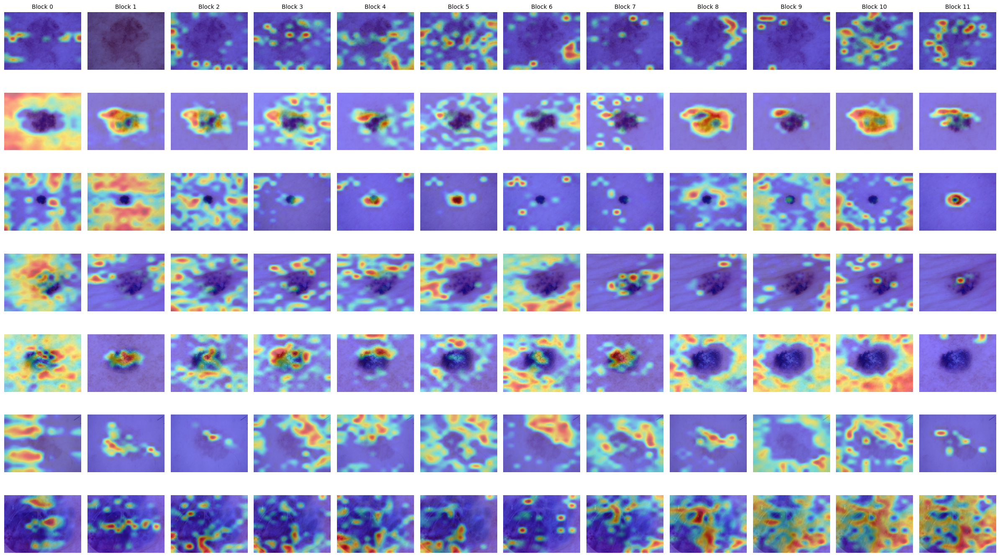

In [68]:
show_all_gradcam(wrong_samples)